# Importing the Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import dice_ml
from dice_ml.utils import helpers 
from IPython.display import Image  
from sklearn.tree import export_graphviz
from sklearn import tree
from pydotplus import graph_from_dot_data

pd.set_option('display.max_columns', None)

# Importing the data

In [2]:
df = pd.read_csv("data/income-cleaned.csv")
df.drop(columns = ['Unnamed: 0'], inplace = True)

In [3]:
type(df)

pandas.core.frame.DataFrame

Input variables:
 
- age: continuous.
- workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.
- education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
- marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
- occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
- hours-per-week: continuous.
- income: Whether income is over $50K

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   age                       1000 non-null   int64
 1   hours_per_week            1000 non-null   int64
 2   income                    1000 non-null   int64
 3   workclass_Other/Unknown   1000 non-null   int64
 4   workclass_Private         1000 non-null   int64
 5   workclass_Self-Employed   1000 non-null   int64
 6   marital_status_Married    1000 non-null   int64
 7   marital_status_Separated  1000 non-null   int64
 8   marital_status_Single     1000 non-null   int64
 9   marital_status_Widowed    1000 non-null   int64
 10  education_Bachelors       1000 non-null   int64
 11  education_Doctorate       1000 non-null   int64
 12  education_HS-grad         1000 non-null   int64
 13  education_Masters         1000 non-null   int64
 14  education_Prof-school     1000 non-null  

In [5]:
df.head()

,age,hours_per_week,income,workclass_Other/Unknown,workclass_Private,workclass_Self-Employed,marital_status_Married,marital_status_Separated,marital_status_Single,marital_status_Widowed,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,occupation_Other/Unknown,occupation_Professional,occupation_Sales,occupation_Service,occupation_White-Collar
0,43,55,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
1,47,40,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
2,28,40,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
3,47,35,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
4,41,40,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1


# Decision Trees

- Supervised Machine Learning algorithm (classification)
- Graph/pathway → making decisions along the way

We continue going through the data splitting it up (partitions) based on the features

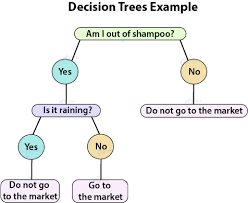

## Brief steps in constructing a decision tree

1. There are features and a target (what class the data point is)
2. Make a *decision* (a split) based on some *metric* using the features
    - data are split into partitions
3. Continue on each partition, and do more splits for each using the features in that partition
4. Keep doing that until a **stopping condition** is hit
    - Number of data points in a final partition
    - Layers deep
    
**Additional Resource**: [R2D3](http://www.r2d3.us/visual-intro-to-machine-learning-part-1/): This is highly recommended for getting a visual introduction to decision trees. Excellent animations explaining the training and prediction stages shown above.

### Note regarding how the splits work

We make the most optimal split at each decision (greedy) decision which doesn't necessarily lead to the overall most optimal solution

## Code for building a decision tree

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier

In [7]:
X = df.drop(columns=['income'], axis = 1)
y = df['income']

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42)

In [9]:
dtree = DecisionTreeClassifier(class_weight = 'balanced', max_depth=7)

In [10]:
dtree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=7)

### Confusion matrix

A confusion matrix is a table that is often used to describe the performance of a classification model (or "classifier") on a set of test data for which the true values are known. The confusion matrix itself is relatively simple to understand, but the related terminology can be confusing. We can look at the true label on the y-axis and the predicted label on the x-axis to gauge the performance of the classification model

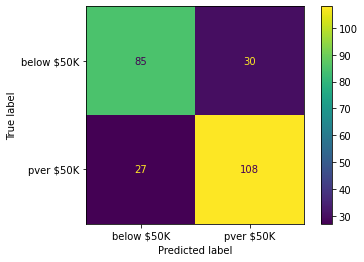

In [11]:
plot_confusion_matrix(dtree, X_test, y_test, display_labels= ['below $50K', 'pver $50K'])

# Interpreting the results

## Visualize the decision tree

In [12]:
# Create DOT data
dot_data = export_graphviz(dtree, out_file="dtree.dot", 
                           feature_names=X_train.columns,  
                           class_names=['Over $50k', 'Less than $50k'], 
                           filled=True, rounded=True, special_characters=True)

# Draw graph
#graph = graph_from_dot_data(dot_data)  

# Show graph
#Image(graph.create_png())

from subprocess import call
call(['dot', '-Tpng', 'dtree.dot', '-o', 'dtree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'dtree.png')

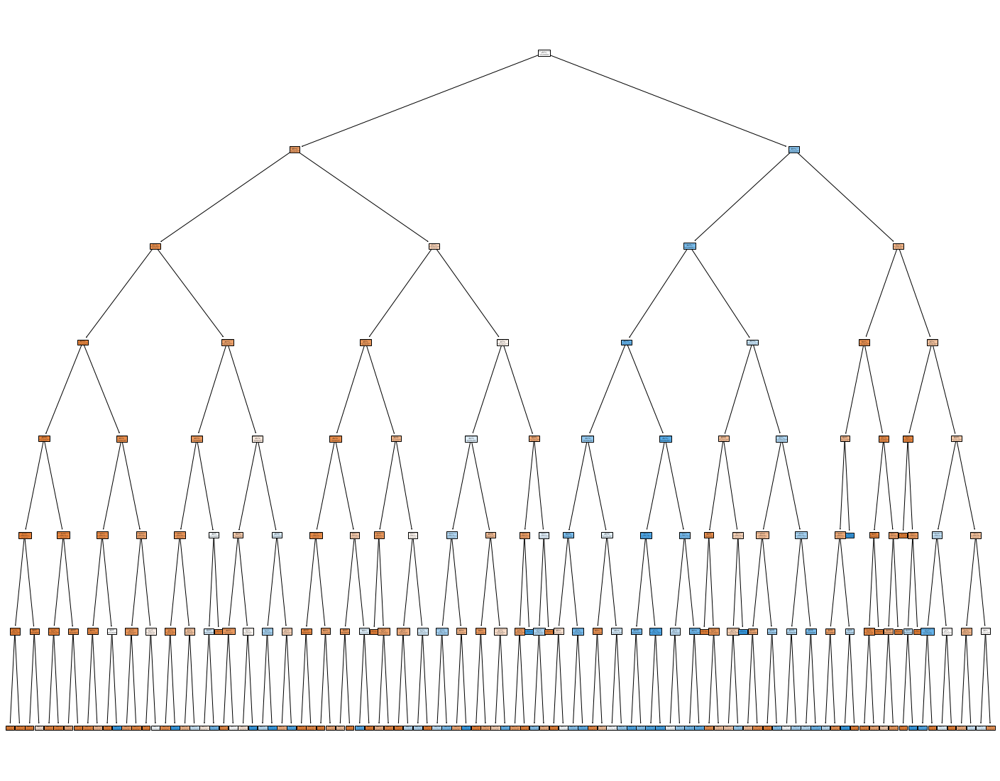

In [12]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(dtree, 
                   feature_names=X_train.columns,  
                   class_names=['Over $50k', 'Less than $50k'],
                   filled=True)
plt.savefig('tree.png')
plt.show()

## Another way to visualize these trees

In [18]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
from interpret.glassbox import ClassificationTree
from interpret import show

In [19]:
dec_tree = ClassificationTree(max_depth=17)

In [20]:
dec_tree.fit(X_train, y_train)

In [21]:
dt_global = dec_tree.explain_global()
show(dt_global)

In [22]:
dt_local = dec_tree.explain_local(X_test[:5], y_test[:5])
show(dt_local)

## SHAP scores

SHAP scores are used to identify what was the impact of a particular feature on the prediction being made. Here we can see that the result is actually a probability of how likely it is that a sample belongs to a particular class of the output. The values in red are the ones that are increasing the probability of the sample belonging to that class and blue ones are reducing that same probability.

In [28]:
import shap

In [29]:
explainer = shap.TreeExplainer(dtree)
shap_values = explainer.shap_values(X_test.values)

In [30]:
shap.initjs()
shap.force_plot(explainer.expected_value[1],shap_values[1][0, :], X_test.iloc[0,:])

The plot below shows an overview of which features are the most important for our entire model over the entire data. This plot reveals that having a Bachelors or Professional degree is very impactful in having an income over $50k

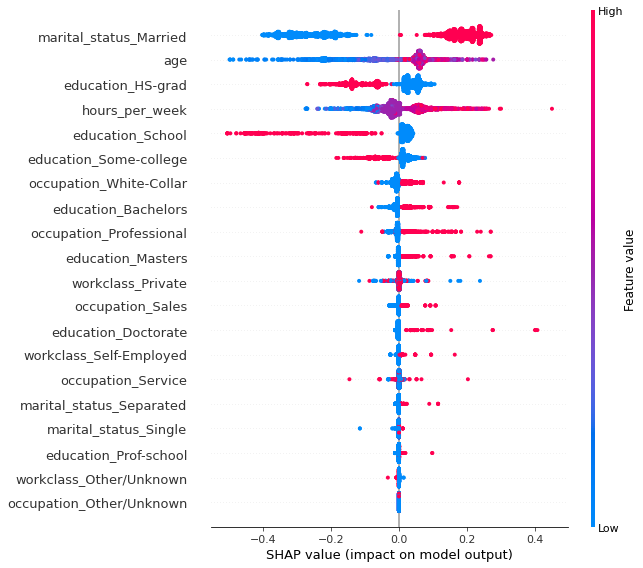

In [31]:
shap.summary_plot(shap_values[1], X_test, plot_type="dot")